<a href="https://colab.research.google.com/github/kchenTTP/python-series/blob/main/python_multiprocessing/Multiprocessing_in_Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Multiprocessing in Python**

In the previous 2 classes, we covered coroutines and multithreading. In this class, we'll cover our last topic on concurrency in python, multiprocessing.

**Table of Contents**

- [Recap: Coroutine vs Threads vs Processes](#scrollTo=ErUeym3cK0tZ)
- [Multiprocessing](#scrollTo=W614FSxj4yYs)
- [Considerations When Using Multiprocessing](#scrollTo=4ynT5XKd3i2q)


## **Recap: Coroutine vs Threads vs Processes**

Before we dive into multiprocessing, let's do a quick recap on coroutines vs threads vs processes using this table.

<br>

<table>
  <thead>
    <tr>
      <th>Aspect</th>
      <th>Coroutines</th>
      <th>Threads</th>
      <th>Processes</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td><strong>Concurrency Model</strong></td>
      <td>Cooperative multitasking within a single thread</td>
      <td>Preemptive multitasking within a process</td>
      <td>Parallel execution with separate processes</td>
    </tr>
    <tr>
      <td><strong>Ideal for</strong></td>
      <td>I/O-bound tasks (waiting for resources)</td>
      <td>I/O-bound tasks, limited for CPU-bound tasks (GIL)</td>
      <td>CPU-bound tasks (true parallelism)</td>
    </tr>
    <tr>
      <td><strong>Resource Usage</strong></td>
      <td>Lightweight, minimal overhead</td>
      <td>More resource-intensive due to OS-level management</td>
      <td>Heavy resource usage due to process creation and IPC</td>
    </tr>
    <tr>
      <td><strong>Memory Sharing</strong></td>
      <td>Shared memory within a single thread</td>
      <td>Shared memory within the process, needs locks</td>
      <td>Separate memory spaces for each process</td>
    </tr>
    <tr>
      <td><strong>Synchronization</strong></td>
      <td>Not required (runs in a single thread)</td>
      <td>Requires locks and synchronization</td>
      <td>Complex, requires inter-process communication (IPC)</td>
    </tr>
    <tr>
      <td><strong>Parallelism</strong></td>
      <td>No, runs in a single thread</td>
      <td>No true parallelism (limited by GIL in CPython)</td>
      <td>Yes, true parallelism using multiple CPU cores</td>
    </tr>
    <tr>
      <td><strong>Ease of Use</strong></td>
      <td>Simpler, no need for locks or complex management</td>
      <td>More complex due to race conditions and deadlocks</td>
      <td>Most complex, with higher overhead and IPC requirements</td>
    </tr>
    <tr>
      <td><strong>Use Cases</strong></td>
      <td>Handling many network or file I/O tasks simultaneously</td>
      <td>Concurrent tasks within a process, some CPU tasks</td>
      <td>CPU-intensive tasks that need full core utilization</td>
    </tr>
  </tbody>
</table>



## **Multiprocessing**

Multiprocessing uses independent processing units to run separate processes in parallel, each with its own **memory space** and **Python interpreter**. This improves performance, especially for CPU-bound tasks that benefit from true parallelism.

<br>

Python offers several ways to implement multiprocessing, but here we'll focus on the basics of using `concurrent.futures.ProcessPoolExecutor()`.

> 🚨 Like the `threading` library, the `multiprocessing` library enables management of individual processes. However, for most simpler tasks, this level of control isn't typically required, so we'll keep our focus on `ProcessPoolExecutor()` for this section.


### **`concurrent.futures.ProcessPoolExecutor()`**

The `ProcessPoolExecutor` class allows you to manage a pool of processes, making it easy to submit and manage CPU-bound tasks in parallel without manually managing individual processes.

<br>

Here's a quick overview of how it works:

  - **Create a Process Pool**: Instantiate a `ProcessPoolExecutor` with a specified number of processes. If you don't specify, it defaults to the number of CPU cores on your machine.
  - **Submit Tasks**: Submit tasks using the **submit()** method, which returns a Future object that represents the eventual result of the task.
  - **Retrieve Results**: Use the **result()** method on the Future object to get the result once the task has completed.

  > ***`Futures`*** represent the eventual result (promise) of an asynchronous computation. They provide methods to check if the computation is done, wait for its completion, and retrieve the result.

<br>

> 📒 **Note:** The `map()` method is also available, which applies a function to all items in an iterable and returns the results in the order of the input. Additionally, you can use `as_completed()` to process tasks as they finish, which does not guarantee task order.

#### **Example: Complex Calculation**

In this example, we'll perform a complex calculation involving factorials, sine operations, and multiple exponentiations.

In [ ]:
import time
import math
from typing import Iterable
from rich.pretty import pprint

In [ ]:
def complex_calculation(n: int | float) -> int | float:
  """
  A CPU-intensive calculation that:
  1. Calculates factorial
  2. Performs sin operations
  3. Performs multiple exponents
  Returns the final result after many iterations
  """
  result = 0
  # Make sure n is not too large to avoid overflow
  working_n = min(n, 100)

  # Calculate factorial
  factorial = math.factorial(working_n)

  # Perform several CPU-intensive calculations
  for i in range(1000000):
    result += math.sin(i) * factorial
    result = math.fmod(result, 10000)  # Keep number manageable

  return result

Establish a list of numbers to perform this calculation on

In [ ]:
numbers = list(range(20, 30))
numbers

[20, 21, 22, 23, 24, 25, 26, 27, 28, 29]

Let's run the calcuations sequentially first


In [ ]:
def run_sequential(numbers: Iterable) -> tuple[Iterable, float]:
  start_time = time.perf_counter()
  results = []

  for n in numbers:
    results.append(complex_calculation(n))

  end_time = time.perf_counter()
  return results, end_time - start_time


seq_results, seq_time = run_sequential(numbers)
print(f"Sequential time: {seq_time:.4f} seconds")

Sequential time: 8.1468 seconds


Then let's see how we can run this calculation in parallel using `concurrent.futures.ProcessPoolExecutor()`

In [ ]:
from concurrent.futures import ProcessPoolExecutor, as_completed

In [ ]:
def run_parallel(numbers: Iterable, max_workers: int | None = None) -> tuple[Iterable, float]:
  start_time = time.perf_counter()
  results = []

  with ProcessPoolExecutor(max_workers=max_workers) as executor:
    results = list(executor.map(complex_calculation, numbers))

  end_time = time.perf_counter()
  return results, end_time - start_time


parallel_results, parallel_time = run_parallel(numbers)
print(f"Parallel time: {parallel_time:.4f} seconds")

Parallel time: 6.5786 seconds


<div align="center">
<img src="https://media.giphy.com/media/oYtVHSxngR3lC/giphy.gif?cid=790b7611v00q23f83wxgh8myd6s260cicv8uyi6p81kl01td&ep=v1_gifs_search&rid=giphy.gif&ct=g" alt="omg" style=/>
<figcaption>OMG!</figcaption>
</div>

We've improved the speed of calculation by a bit using mutliprocessing! Let's double check the results:


In [ ]:
print(f"Speedup: {seq_time/parallel_time:.2f}x")

# Verify results are the same
if seq_results == parallel_results:
  print("Results match! ✓")
else:
  print("Warning: Results don't match!")

Speedup: 1.24x
Results match! ✓


### **`multiprocessing` (Additional Material)**

The `multiprocessing` library in Python is a package that enables parallel processing by creating separate Python processes. Unlike threading, multiprocessing bypasses the Global Interpreter Lock (GIL) and allows true parallel execution, making it ideal for CPU-bound tasks that require intensive computation.

<br>

Here's a quick overview of how it works:

- **Creating Processes**: You can create a new process by instantiating the Process class and passing it a target function. Each process runs in its own memory space.
- **Starting and Joining Processes**: Processes are started with the `start()` method and can be waited on using the `join()` method.
- **Inter-Process Communication**: Since processes don't share memory, they communicate through various mechanisms like `Queue`, `Pipe`, or shared memory objects provided by the multiprocessing module.

<br>

> 📒 **Note:** While multiprocessing is powerful for CPU-intensive tasks, it has more overhead than threading due to process creation and inter-process communication. For most CPU-bound tasks, `concurrent.futures.ProcessPoolExecutor()` provides a higher-level and more convenient interface.


Let's use the same example above but this time using the `multiprocessing` library instead.

In [ ]:
from multiprocessing import Process, Queue

In [ ]:
def run_parallel_m(numbers: list) -> tuple[list, float]:
  start_time = time.perf_counter()
  processes = []
  result_queue = Queue()

  def worker(num: int, queue: Queue) -> None:
    result = complex_calculation(num)
    queue.put(result)

  # Create and start processes
  for number in numbers:
    p = Process(target=worker, args=(number, result_queue))
    processes.append(p)
    p.start()

  # Wait for all processes to complete
  for p in processes:
    p.join()

  # Collect results
  results = [result_queue.get() for _ in range(len(numbers))]

  end_time = time.perf_counter()
  return results, end_time - start_time


parallel_m_results, parallel_m_time = run_parallel_m(numbers)
print(f"Parallel time: {parallel_m_time:.4f} seconds")

Parallel time: 6.3716 seconds


You'll notice that here we need to use `Queue` to retrieve results from different processes. Think of `Queue` as a form of inter-process communication that handles these key aspects for us:

- **Process Safety**: Queue handles all the locking and synchronization internally
- **Memory Management**: Queue handles the memory transfer between processes
- **State Management**: Queue maintains its state across processes

Here are some common methods in `Queue`:

- `put(item)`: Adds an item to the queue
- `get()`: Removes and returns an item from the queue
- `empty()`: Checks if the queue is empty
- `full()`: Checks if the queue is full

Now, let's compare the result from our new parallel function with our sequential one.

In [ ]:
print(f"Speedup: {seq_time/parallel_m_time:.2f}x")

# Verify results are the same
if seq_results.sort() == parallel_m_results.sort():
  print("Results match! ✓")
else:
  print("Warning: Results don't match!")

Speedup: 1.28x
Results match! ✓


### **Example: Audio Processing**

Let's walk through another example of processing audio files using the `pedalboard` library to add effects to multiple files.

  > 🚨 **Note:** Multiprocessing isn't strictly necessary with the `pedalboard` library, as it leverages C++ for processing and bypasses Python's Global Interpreter Lock (GIL) to utilize multiple CPU cores. So even if we're doing a lot of audio processing, in this case it didn't make much of a difference, as we'll see shortly.

<br>

**Imports**

- [`librosa`](https://librosa.org/doc/main/index.html): A Python library for music and audio analysis
- [`pedalboard`](https://github.com/spotify/pedalboard): A library for providing studio-quality audio effects
- [numpy](https://numpy.org/doc/stable/user/index.html#user): A library for numerical operations, used here to handle audio data as arrays and perform mathematical transformations
- [`matplotlib.pyplot`](https://matplotlib.org/3.5.3/api/_as_gen/matplotlib.pyplot.html): A plotting library for visualizing audio waveforms and other data
- `IPython.display.Audio`: An audio player for Jupyter notebooks


In [ ]:
# Install pedalboard library
!pip install pedalboard

# Import libraries
import librosa
import pedalboard
import numpy as np
from pedalboard import Pedalboard
from pedalboard.io import AudioFile
import matplotlib.pyplot as plt
import librosa.display
from IPython.display import Audio

%matplotlib inline

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 48.1 MB/s eta 0:00:00


Let's first create a data structure called `Music` to hold our music data before and after applying audio effects.

  > 💡 `dataclasses` are classes meant to hold data efficiently, making it easier to organize and manage related information in a structured way.

In [ ]:
from dataclasses import dataclass

@dataclass
class Music:
  name: str
  samplerate: int
  data: np.ndarray

Then let's read the data and store them in a list of `Music`.

In [ ]:
SR = 44100
music_names = ["vibeace", "choice", "nutcracker"]

music_data = []
for name in music_names:
  y, _ = librosa.load(librosa.example(name, hq=True), sr=SR)
  music_data.append(
      Music(name=name, samplerate=SR, data=y)
  )

print(music_data)

[Music(name='vibeace', samplerate=44100, data=array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)), Music(name='choice', samplerate=44100, data=array([0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 1.0840904e-07,
       1.0810460e-06, 1.1201665e-06], dtype=float32)), Music(name='nutcracker', samplerate=44100, data=array([0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 3.8444509e-06,
       3.7634168e-06, 4.0605564e-06], dtype=float32))]


#### **Display Audio**
Now that we've loaded all our audio data, let's take a look at the waveform and listen to 10 second of each track.

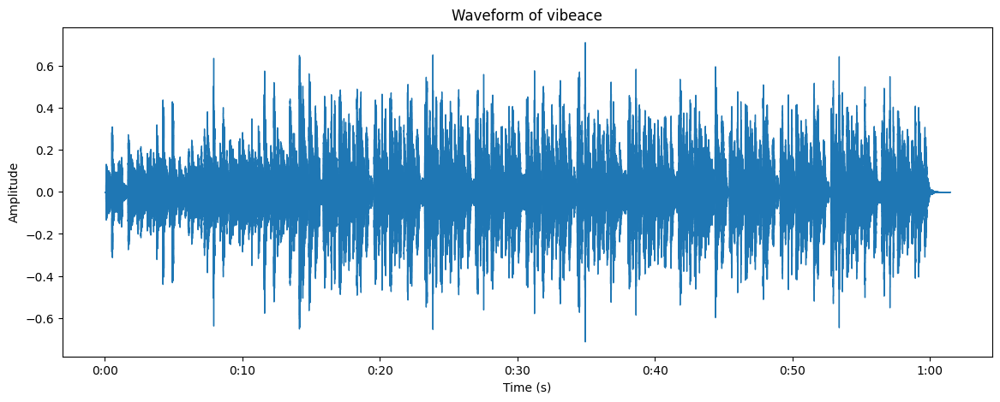

In [ ]:
music = music_data[0]

plt.figure(figsize=(14, 5))
librosa.display.waveshow(music.data, sr=music.samplerate)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title(f"Waveform of {music.name}")
plt.show()

Audio(music.data[:10 * music.samplerate], rate=music.samplerate)

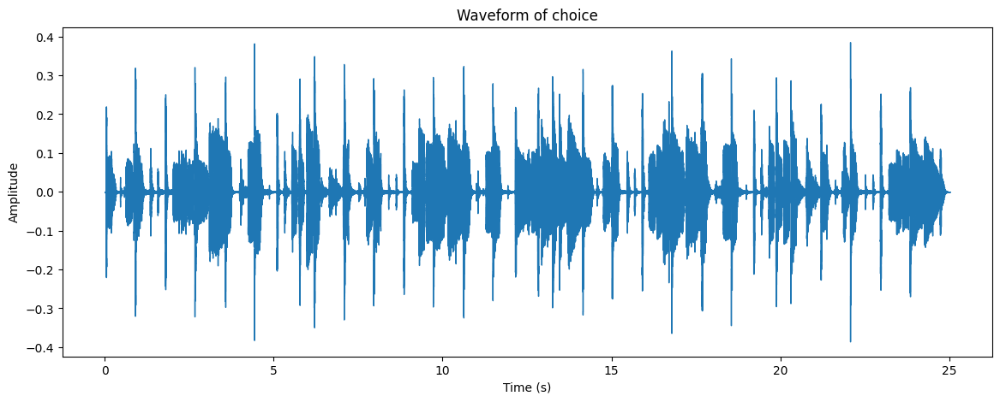

In [ ]:
music = music_data[1]

plt.figure(figsize=(14, 5))
librosa.display.waveshow(music.data, sr=music.samplerate)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title(f"Waveform of {music.name}")
plt.show()

Audio(music.data[:10 * music.samplerate], rate=music.samplerate)

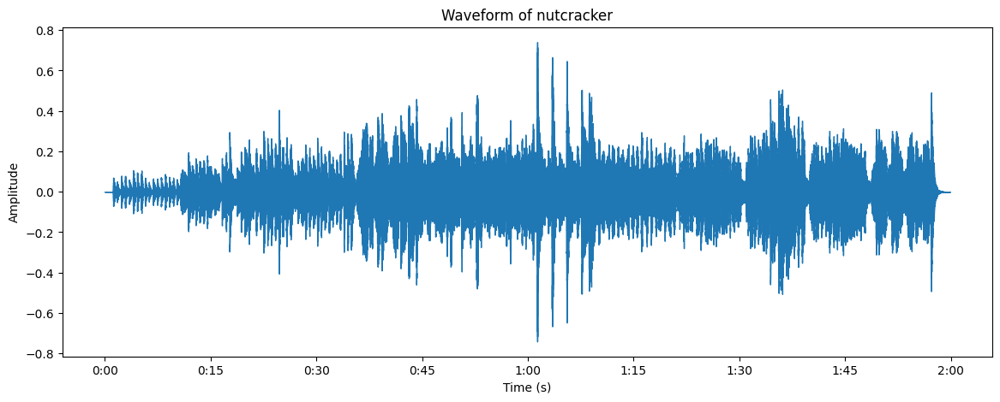

In [ ]:
music = music_data[2]

plt.figure(figsize=(14, 5))
librosa.display.waveshow(music.data, sr=music.samplerate)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title(f"Waveform of {music.name}")
plt.show()

Audio(music.data[:10 * music.samplerate], rate=music.samplerate)

#### **Audio Processing Chain**
Let's first create a function that will process one audio file using the pedalboard library.

In [ ]:
def add_effects(music: Music) -> Music:
  # Passthrough channel for original audio
  passthrough = pedalboard.Gain(gain_db=0)

  # Saturation effects chain
  saturation = pedalboard.Pedalboard([
      pedalboard.Distortion(drive_db=30),
      pedalboard.LadderFilter(mode=pedalboard.LadderFilter.HPF12, cutoff_hz=150, resonance=0.75),
      pedalboard.Gain(-6),
  ])

  # Delay and pitch shift effects chain
  pitch_shifted_delay = pedalboard.Pedalboard([
      pedalboard.LadderFilter(mode=pedalboard.LadderFilter.HPF12, cutoff_hz=250, resonance=0.75),
      pedalboard.PitchShift(semitones=7),
      pedalboard.Delay(delay_seconds=0.5, mix=1.0),
      pedalboard.Chorus(),
      pedalboard.Limiter(),
      pedalboard.Gain(1.5),
  ])

  # Process audio in parallel (music production, not the computer science “parallel processing” we're covering in this class) using the Mix() method
  board = pedalboard.Pedalboard([
      pedalboard.Compressor(),
      pedalboard.Mix([
        passthrough,
        saturation,
        pitch_shifted_delay,
      ]),
      pedalboard.Reverb(room_size=0.75, wet_level=0.9),
  ])

  return Music(
    name=music.name,
    samplerate=music.samplerate,
    data=board(music.data, music.samplerate, reset=False)
  )

#### **Single Process**

Now let's take a look at how much time it takes to simply process all the audio files sequentially inside a for loop

In [ ]:
def process_sequential(music_data: list[Music]) -> tuple[list[Music], float]:
  start = time.perf_counter()

  results = []
  for music in music_data:
    results.append(add_effects(music))

  end = time.perf_counter()
  return results, end - start


seq_results, seq_time = process_sequential(music_data)
print(f"Processed {len(seq_results)} files...")
print(f"Sequential time: {seq_time:.4f} seconds")
print("---")
pprint(seq_results)

Processed 3 files...
Sequential time: 20.8932 seconds
---


[
│   Music(
│   │   name='vibeace',
│   │   samplerate=44100,
│   │   data=array([0.        , 0.        , 0.        , ..., 0.17829919, 0.16918273,
│      0.16146839], dtype=float32)
│   ),
│   Music(
│   │   name='choice',
│   │   samplerate=44100,
│   │   data=array([ 0.        ,  0.        ,  0.        , ...,  0.00476032,
│      -0.11862694, -0.07012684], dtype=float32)
│   ),
│   Music(
│   │   name='nutcracker',
│   │   samplerate=44100,
│   │   data=array([ 0.        ,  0.        ,  0.        , ...,  0.00460654,
│      -0.00118794, -0.0074852 ], dtype=float32)
│   )
]

#### **Multiprocess**

Perfect! Now let's leverage multiprocessing to apply audio effects to our musics


In [ ]:
def process_parallel(music_data: list[Music]) -> tuple[list[Music], float]:
  start = time.perf_counter()

  with ProcessPoolExecutor(max_workers=len(music_data)) as executor:
    futures = [executor.submit(add_effects, music) for music in music_data]
    results = []
    for future in as_completed(futures):
      results.append(future.result())

  end = time.perf_counter()
  return results, end - start


parallel_results, parallel_time = process_parallel(music_data)
print(f"Processed {len(seq_results)} files...")
print(f"Parallel time: {parallel_time:.4f} seconds")
print("---")
pprint(parallel_results)

Processed 3 files...
Parallel time: 18.4625 seconds
---


[
│   Music(
│   │   name='choice',
│   │   samplerate=44100,
│   │   data=array([ 0.        ,  0.        ,  0.        , ...,  0.00476032,
│      -0.11862694, -0.07012684], dtype=float32)
│   ),
│   Music(
│   │   name='vibeace',
│   │   samplerate=44100,
│   │   data=array([0.        , 0.        , 0.        , ..., 0.17829919, 0.16918273,
│      0.16146839], dtype=float32)
│   ),
│   Music(
│   │   name='nutcracker',
│   │   samplerate=44100,
│   │   data=array([ 0.        ,  0.        ,  0.        , ...,  0.00460654,
│      -0.00118794, -0.0074852 ], dtype=float32)
│   )
]

Let's compare the two


In [ ]:
print(f"Speedup: {seq_time/parallel_time:.2f}x")

Speedup: 1.13x


As you can see, both approaches take about the same amount of time to complete, and sometimes the `for loop` version is even faster.

This is due to the fact that the `pedalboard` library is *highly optimized and does not block the
Global Interpreter Lock (GIL)*. Therefore, the difference in performance is minimal in this example.

<br>

<div align="center">
<img src="https://media.giphy.com/media/QjrrSbYaqgi1q/giphy.gif?cid=ecf05e476vthphmtaqsmff1cxk14hx5281tybpezmqxyuqca&ep=v1_gifs_search&rid=giphy.gif&ct=g" alt="suprised woman" style=/>
<figcaption>Huh?</figcaption>
</div>

<br>

We will explore more about this in the next section, where we'll discuss important considerations when using multiprocessing and multithreading.


#### **Results**

Now let's take a look at the waveform after applying the effects and listen the the audio files

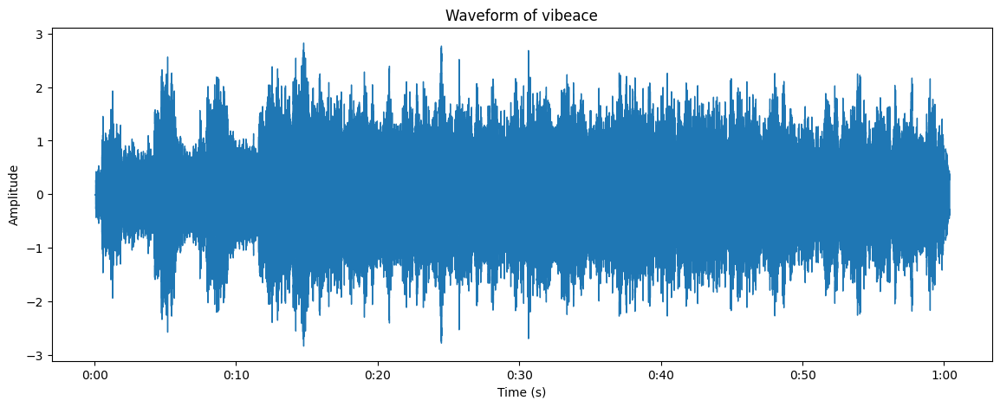

In [ ]:
music = seq_results[0]

plt.figure(figsize=(14, 5))
librosa.display.waveshow(music.data, sr=music.samplerate)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title(f"Waveform of {music.name}")
plt.show()

Audio(music.data[:20 * music.samplerate], rate=music.samplerate)

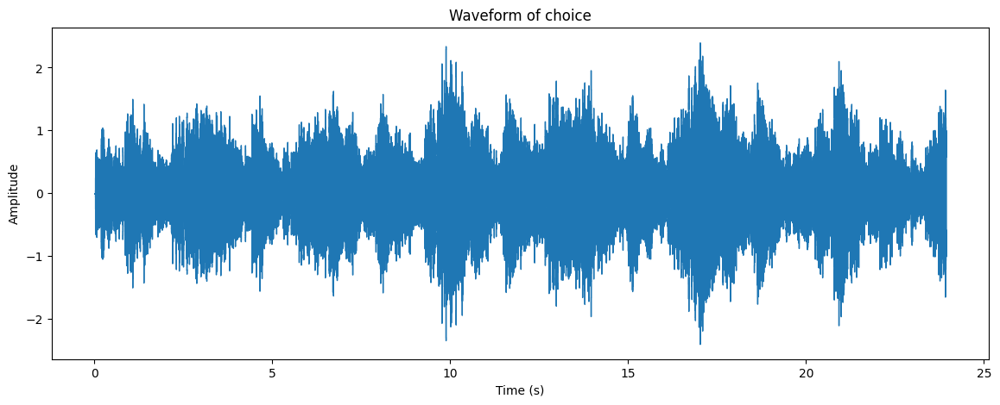

In [ ]:
music = seq_results[1]

plt.figure(figsize=(14, 5))
librosa.display.waveshow(music.data, sr=music.samplerate)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title(f"Waveform of {music.name}")
plt.show()

Audio(music.data[:20 * music.samplerate], rate=music.samplerate)

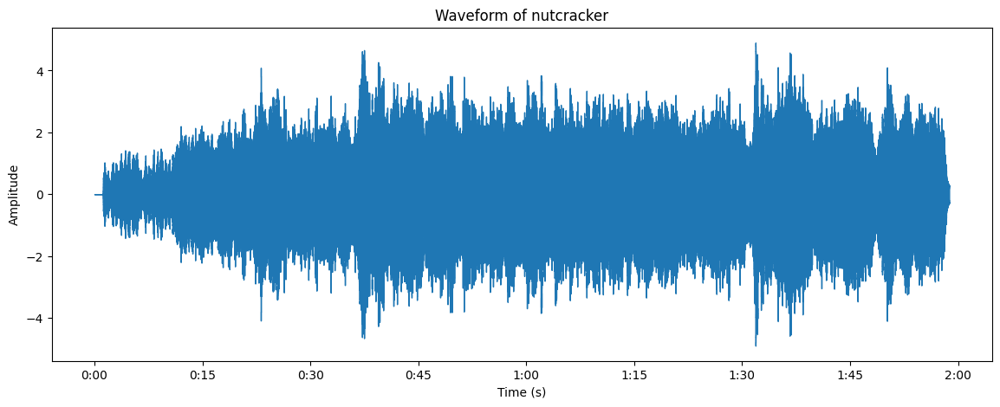

In [ ]:
music = seq_results[2]

plt.figure(figsize=(14, 5))
librosa.display.waveshow(music.data, sr=music.samplerate)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title(f"Waveform of {music.name}")
plt.show()

Audio(music.data[:20 * music.samplerate], rate=music.samplerate)

## **Considerations When Using Multiprocessing**

When using multiprocessing, we should consider several important factors to ensure efficiency and avoid common challenges:

- **Inter-Process Communication (IPC)**

  Processes have separate memory spaces, so sharing data requires inter-process communication mechanisms like Queue, Pipe, or shared memory. These tools facilitate data transfer between processes, but each introduces some overhead, so choose the most efficient IPC based on your needs.

-	**Memory Usage and Resource Allocation**

  Each process requires its own memory space and resources, which can increase memory usage significantly (as you can see in the Colab resource usage tab, we are using a lot more RAM when doing multiprocessing). This may limit the number of processes that can be run simultaneously, especially on memory-constrained systems. Evaluate memory requirements to avoid resource exhaustion.

-	**Process Start-Up and Shutdown Costs**

  Starting and managing multiple processes adds overhead, as each process requires initialization and termination time. For shorter tasks, this setup time may outweigh any performance gain. Multiprocessing is most effective for long-running or CPU-bound tasks where parallelism justifies the start-up costs.

  > 🚨 *As seen in our audio processing example, when calculations are already highly optimized, multiprocessing may add little to no benefit.*

-	**Concurrency without GIL Constraints**

  Unlike multithreading, multiprocessing bypasses the Global Interpreter Lock (GIL) in Python by having multiple Python interpreters in different processes, allowing true parallelism across CPU cores. This makes it ideal for CPU-intensive tasks that benefit from full utilization of multi-core systems, providing a performance boost unavailable with threads alone.

<br>

Considering these factors can help determine if multiprocessing is suitable for your tasks or if alternatives like multithreading or asynchronous programming might be more efficient.

This concludes our exploration of concurrency and multitasking in Python, I hope you now have a solid foundation for handling multiple tasks efficiently, whether through threading, multiprocessing, or asynchronous programming.